In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/tmp/ipykernel_50772/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [3]:
import os
os.chdir('../')
import torch
import pandas as pd
import numpy as np
import yaml
from sklearn import decomposition
from harmony import harmonize
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib import cm
from tqdm import tqdm
import utils.label_dict
from utils.label_dict import protein_to_num_single_cells
from utils.analysis_utils import plot_UMAP, get_embeddings, create_cell_comparison, create_protein_hierarchy, get_gene_heterogeneity_enrichement, plot_gene_heterogeneity_enrichement, get_heterogeneity_df, scale, get_heterogeneousity_per_whole_image
from scipy.spatial.distance import pdist, cdist
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from seaborn import clustermap
from skimage import io


### Create UMAPs

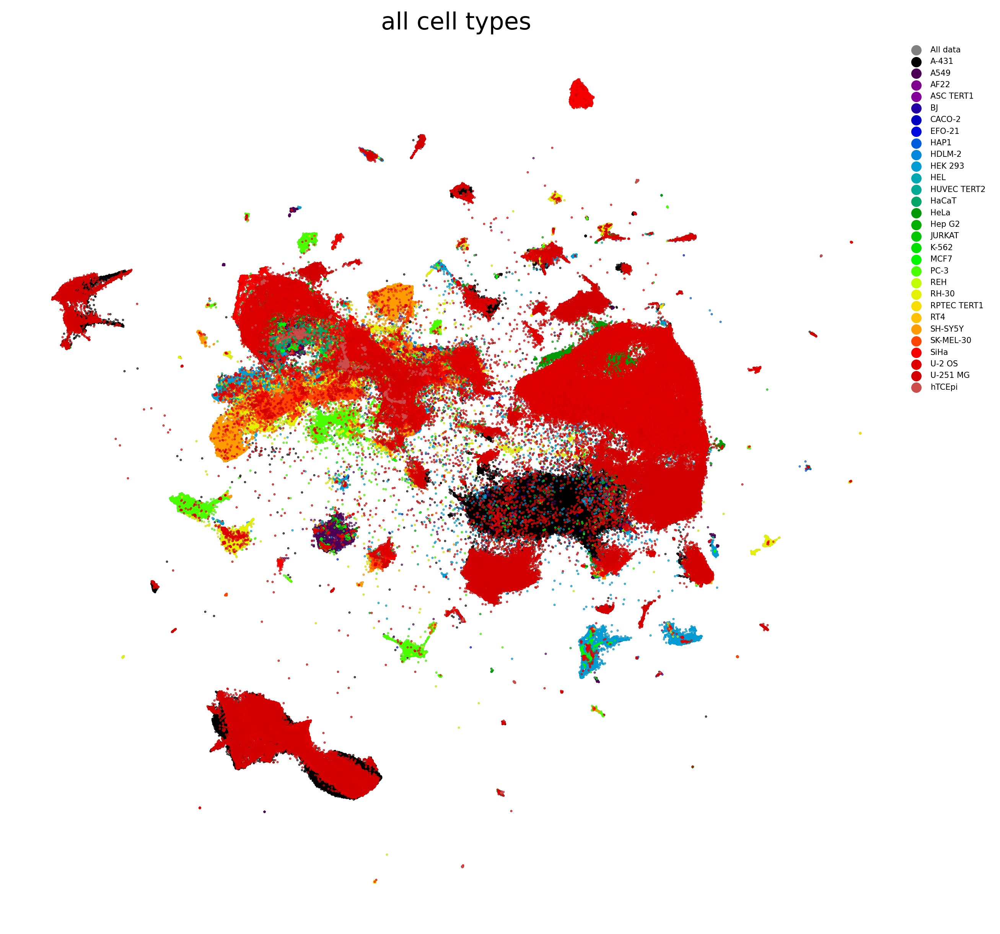

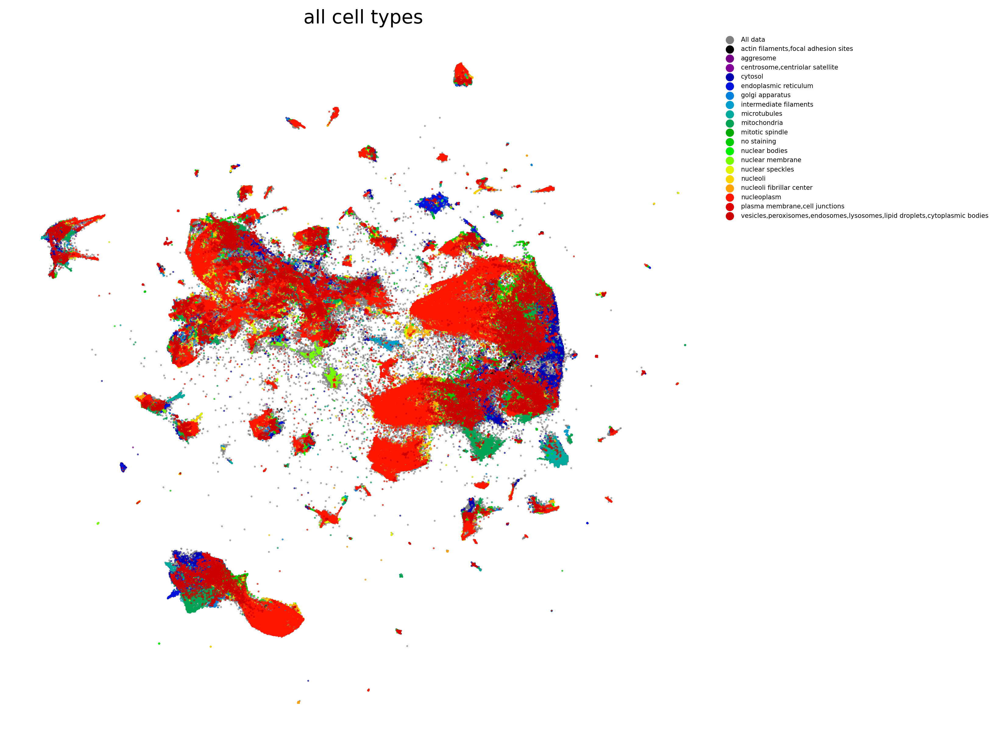

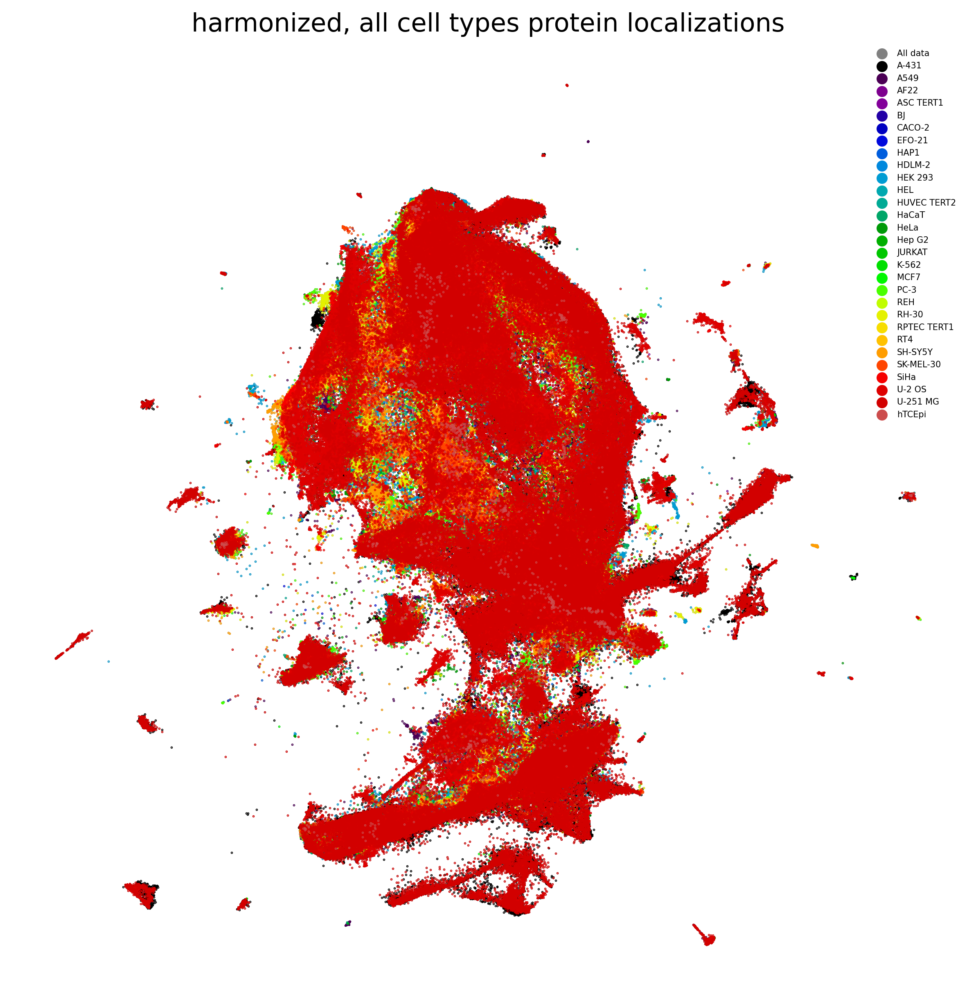

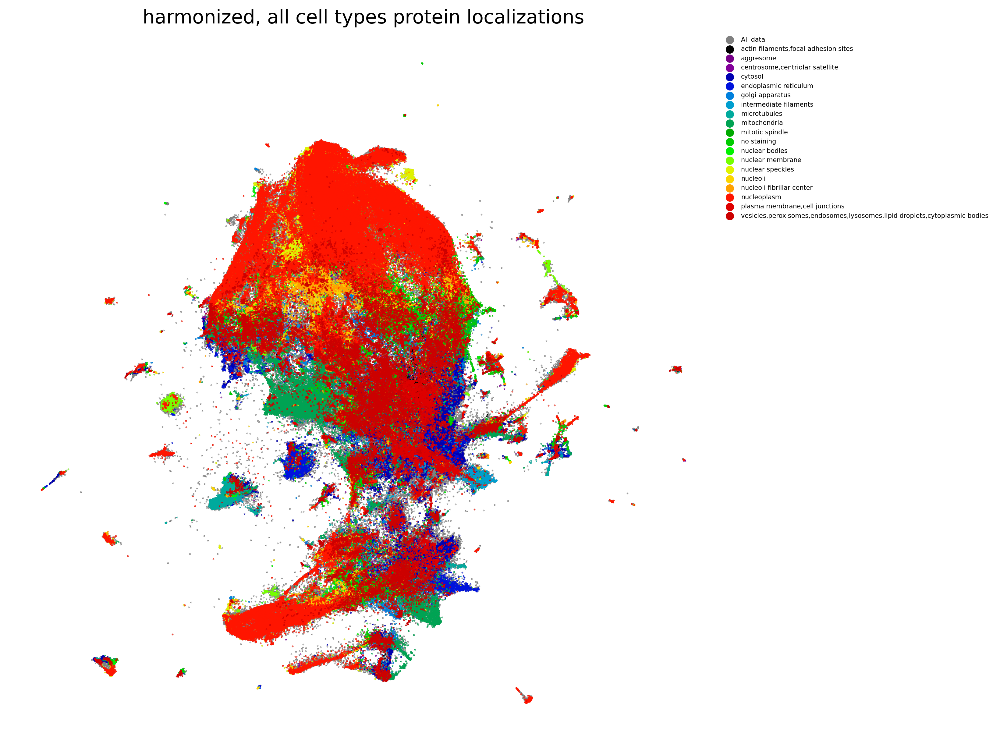

In [3]:
create_new_embeddings = False
features, protein_localizations, cell_lines, IDs, df = torch.load('HPA_single_cells_data/DINO_features_for_HPA_single_cells.pth')
df['website'] = df.file.str.contains('-').astype(int)
protein_labls = protein_to_num_single_cells
if create_new_embeddings:
    pca = decomposition.PCA(n_components=100)
    reduced_features = pca.fit_transform(features)

    harmonized_features = harmonize(torch.Tensor(reduced_features).numpy(), 
                                    df,
                                    batch_key = ['cell_type'], 
                                    use_gpu=True,
                                    random_state=42,
    )
    one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]

    harmonized_mean_df = pd.DataFrame(pd.concat((pd.DataFrame(harmonized_features[one_protein_indices], columns=[f'f_{i}' for i in range(len(harmonized_features[0]))]),
                           pd.DataFrame(np.array(IDs)[one_protein_indices], columns=['ID'])), 
                           axis=1)).groupby('ID')
    harmonized_mean_features = harmonized_mean_df.mean()[[f'f_{i}' for i in range(len(harmonized_features[0]))]].values

    single_df = pd.DataFrame(pd.concat((pd.DataFrame(reduced_features[one_protein_indices], columns=[f'f_{i}' for i in range(len(reduced_features[0]))]),
                           pd.DataFrame(np.array(IDs)[one_protein_indices], columns=['ID'])), 
                           axis=1)).groupby('ID')
    first_features = single_df.mean()[[f'f_{i}' for i in range(len(reduced_features[0]))]].values

    features_to_fit = first_features
    features_to_extract = reduced_features
    harmonized_features_to_fit = harmonized_mean_features
    harmonized_features_to_extract = harmonized_features

    umap_reducer, features_mean, features_std, harmonized_embedding, scaled_features = get_embeddings(torch.Tensor(harmonized_features_to_fit), torch.Tensor(harmonized_features_to_extract)) 
    umap_reducer, features_mean, features_std, embedding, scaled_features = get_embeddings(torch.Tensor(features_to_fit), torch.Tensor(features_to_extract)) 
else:
    embedding = pd.read_csv('/scr/mdoron/Dino4Cells_analysis/HPA_single_cells_data/DINO_embedding_average_umap.csv')[['UMAP_1','UMAP_2']].values
    harmonized_embedding = pd.read_csv('/scr/mdoron/Dino4Cells_analysis/HPA_single_cells_data/DINO_harmonized_embedding_average_umap.csv')[['UMAP_1','UMAP_2']].values
    
plot_UMAP(df, ['cell_type'], embedding,  f'all cell types', 'results/HPA_single_cells/HPA_single_cells_cell_types.pdf')
plot_UMAP(df, protein_labls, embedding,  f'all cell types', 'results/HPA_single_cells/HPA_single_cells_protein_localizations.pdf')
plot_UMAP(df, ['cell_type'], harmonized_embedding,  f'harmonized, all cell types protein localizations', 'results/HPA_single_cells/HPA_single_cells_cell_types_harmonized.pdf')
plot_UMAP(df, protein_labls, harmonized_embedding,  f'harmonized, all cell types protein localizations', 'results/HPA_single_cells/HPA_single_cells_protein_localizations_harmonized.pdf')


### Plot mutual information

In [5]:
from sklearn.metrics import mutual_info_score

def create_bins(x):
    unique_xs = sorted(np.unique(x))
    bins = [unique_xs[0] - 0.5]
    for ind in range(len(unique_xs) - 1):
        bins.append(unique_xs[ind] + (unique_xs[ind + 1] - unique_xs[ind]) / 2)
    bins = bins + [unique_xs[-1] + 0.5]  
    return bins

def mutual_info(x,y,code_bin, factor_bin):
    c_xy = np.histogram2d(x,y,(code_bin, factor_bin))[0]
    mi = 0
    N = np.sum(c_xy)
    for i in range(c_xy.shape[0]):
        for j in range(c_xy.shape[1]):
            p_i = np.sum(c_xy[i,:]) / N
            p_j = np.sum(c_xy[:,j]) / N
            p_ij = c_xy[i,j] / N
            if p_ij == 0: 
                mi += 0 
            else:
                mi += (p_ij) * np.log(p_ij / (p_i * p_j))
    return mi

def conditional_mutual_info(x,y,z,bins):
    c_xyz = np.histogramdd((x, 
                          y, 
                          z),
                          bins)[0]
    N = np.sum(c_xyz)
    mi = 0
    p_z = c_xyz.sum(axis=(0,1)) / N
    p_iz = c_xyz.sum(axis=(1)) / N
    p_jz = c_xyz.sum(axis=(0)) / N
    p_ijzs = c_xyz / N
    N = np.sum(c_xyz)
    for i in (range(c_xyz.shape[0])):
        for j in range(c_xyz.shape[1]):
            for z in range(c_xyz.shape[2]):
                if p_ijzs[i,j,z] == 0: 
                    mi += 0 
                else:
                    mi += (p_ijzs[i,j,z]) * np.log((p_z[z] * p_ijzs[i,j,z]) / (p_iz[i,z] * p_jz[j,z]))
    return mi    


def MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

In [8]:
feature_files = [
    'HPA_single_cells_data/DINO_features_for_HPA_single_cells.pth',
    'HPA_single_cells_data/DINO_features_for_HPA_single_cells.pth',
    'HPA_single_cells_data/dualhead_features_for_HPA_single_cells.pth',
               ]
labels = [
    'Trained DINO',
    'Trained DINO, harmonized',
    'Dualhead',
             ]

single_model_labels = labels
single_mi_matrices = []
factor_gaps_per_method = []
code_bins = [25]
factor_bins = [25]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for feature_file, label in zip(feature_files, labels):
        features, protein_localizations, cell_lines, IDs, df = torch.load(feature_file)    
        try:
            protein_localizations = torch.stack(protein_localizations)
        except:
            pass
        protein_localizations = torch.Tensor(protein_localizations)
        
        pca = decomposition.PCA(n_components=100)
        features = pca.fit_transform(features)
        
        one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
        website_indices = np.where(df.ID.str.contains('_'))[0]
        website_features = features[website_indices,:]
        website_df = df.iloc[website_indices].reset_index()
        website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
        website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
        website_proteins = protein_localizations[website_indices]                
        cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
        website_cell = cell_mat[website_indices]
        one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
        if 'harmonized' in label:
            website_features = harmonize(torch.Tensor(website_features).numpy(), 
                                            website_df,
                                            batch_key = ['cell_type'], 
                                            use_gpu=True,
                                            random_state=42,
            )
            
        website_features = torch.Tensor(website_features)
        website_features -= website_features.min(axis=0)[0]
        website_features /= website_features.max(axis=0)[0]
        
        factors = np.stack((
            np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
            np.argmax(website_cell[one_protein_indices], axis=1),
            website_df['well'].values[one_protein_indices].astype(int))
        ).T
        codes = website_features[one_protein_indices]

        whole_HPA_protein_MI = []
        whole_HPA_cell_MI = []
        whole_HPA_well_MI = []

        for i in tqdm(range(website_features.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, factor_bin)
            whole_HPA_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, factor_bin)
            whole_HPA_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, factor_bin)
            whole_HPA_well_MI.append(well_mi)      
        mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        single_mi_matrices.append(mi_matrix)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 23.93it/s]


Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 23.47it/s]


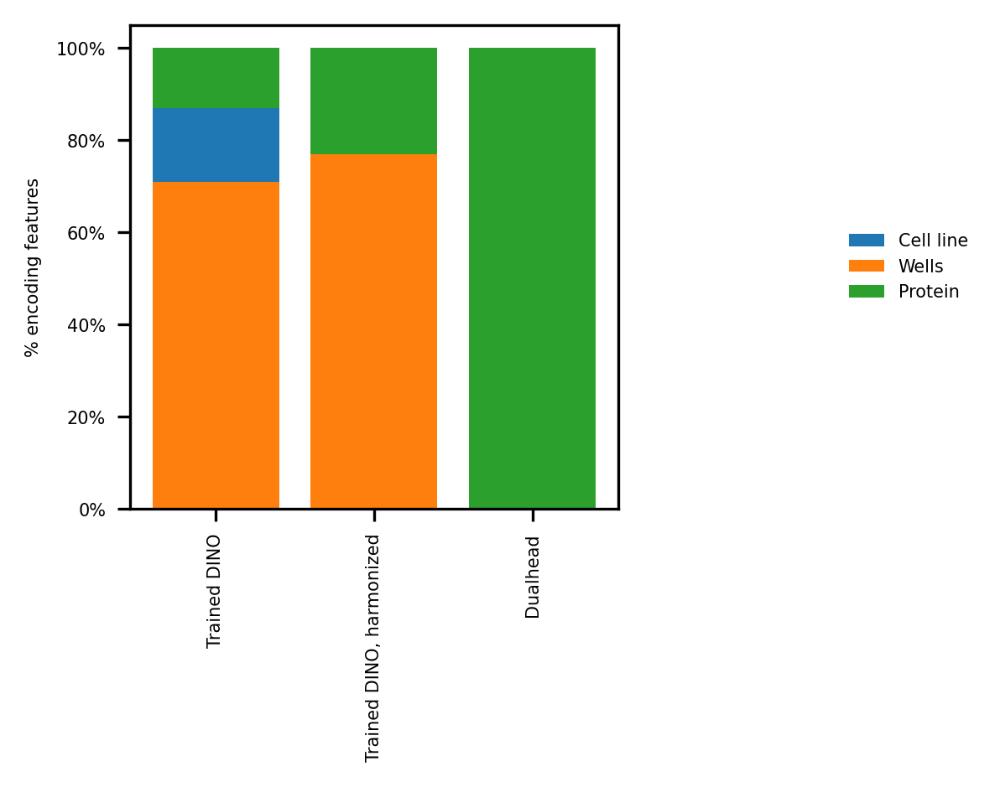

In [10]:
import matplotlib.ticker as mtick
import matplotlib.gridspec as gridspec
from scipy.stats import pearsonr
cmap = cm.nipy_spectral

dominant_fov_percentages = []
for matrix_ind, (mi_matrix, mi_label) in enumerate(zip(single_mi_matrices, single_model_labels)):
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))
    dominant_fov_percentage = [len(high_protein) / len(new_indices),
                               len(high_cell) / len(new_indices),
                               len(high_well) / len(new_indices),]
    dominant_fov_percentages.append(dominant_fov_percentage)
                               
dominant_fov_percentages = np.array(dominant_fov_percentages) * 100
dominant_fov_percentages = dominant_fov_percentages[:,np.argsort(dominant_fov_percentages[0,:])[::-1]]
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5), dpi=300)
plt.bar(
    range(len(dominant_fov_percentages)),
    bottom = dominant_fov_percentages[:,:1].sum(axis=1),
    height = dominant_fov_percentages[:,1],
    label='Cell line',
       )
plt.bar(
    range(len(dominant_fov_percentages)),
    bottom = 0,
    height = dominant_fov_percentages[:,0],
    label='Wells',
       )
plt.bar(
    range(len(dominant_fov_percentages)),
    bottom = dominant_fov_percentages[:,:2].sum(axis=1),
    height = dominant_fov_percentages[:,2],
    label='Protein'
       )
plt.legend(bbox_to_anchor=(1.75,0.5), loc='center right', frameon=False)
plt.ylabel('% encoding features')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.xticks(range(len(single_model_labels)),single_model_labels, rotation=90)
plt.savefig('results/HPA_single_cells/HPA_single_cells_mutual_information.pdf',format='pdf')

### Plot Kaggle results

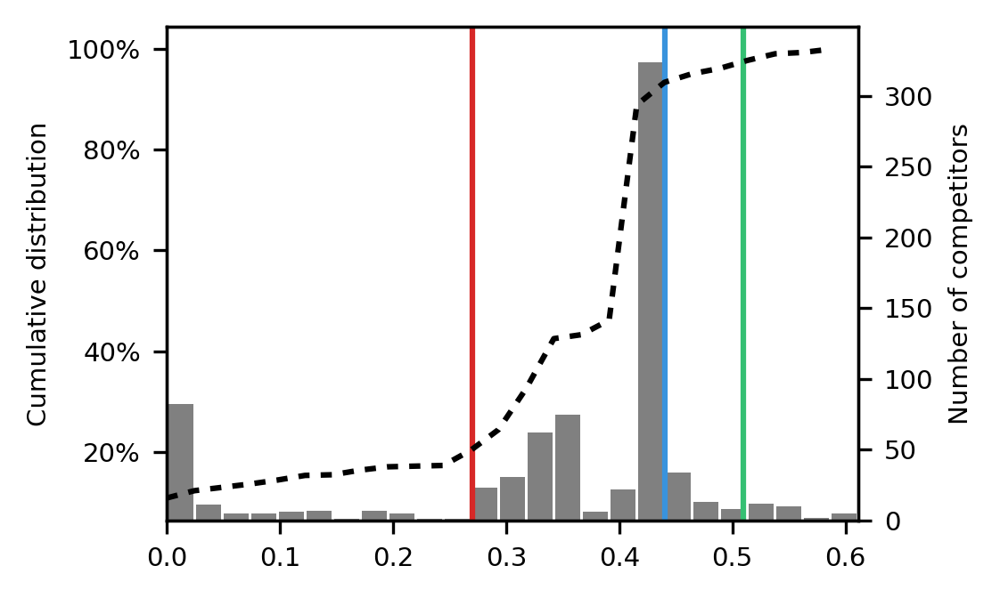

In [4]:
# os.chdir('Dino4Cells_analysis/')
whole_image_leaderboard = pd.read_csv('HPA_single_cells_data/hpa-single-cell-image-classification-publicleaderboard.csv')
font = {'size'   : 7}
matplotlib.rc('font', **font)

fig, axis = plt.subplots(1,1,figsize=(2.5 * 1.5,1.5 * 1.5), dpi=300)

values = plt.hist(whole_image_leaderboard.Score, bins=25, label='Frequency', rwidth=0.9, color='grey')
cumulative = np.cumsum(values[0])
cumulative /= cumulative.max()
cumulative *= 100


DINO = 0.44
Kaggle =  0.51
pretrained = 0.27

lw = 1.5
plt.axvline(x=DINO, color='#3993dd', label='DINO', linewidth=lw)
plt.axvline(x=Kaggle, color='#35c073', label='Kaggle', linewidth=lw)
plt.axvline(x=pretrained, color='#d72827', label='Pretrained', linewidth=lw)
plt.axis([whole_image_leaderboard.Score.min(), whole_image_leaderboard.Score.max(), 0, np.max(values[0]) + 25])
ax2 = axis.twinx()
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax2.plot(values[1][:-1], cumulative, color='black', dashes=[2], label='Cumulative', linewidth=lw)
plt.xlabel('Performance on test')
axis.set_ylabel('Number of competitors')
# axis.set_yticks([0, 100, 200, 300, 400, 500])
ax2.set_ylabel('Cumulative distribution')

ax2.spines["left"].set_visible(True)
ax2.yaxis.set_label_position('left')
ax2.yaxis.set_ticks_position('left')

axis.spines["right"].set_visible(True)
axis.yaxis.set_label_position('right')
axis.yaxis.set_ticks_position('right')

plt.tight_layout()
plt.savefig('results/HPA_single_cells/HPA_single_cells_Kaggle.pdf')

### Plot Single Cell Heterogeneity

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10567/10567 [00:00<00:00, 142488.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10567/10567 [00:00<00:00, 140093.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10567/10567 [00:00<00:00, 128928.43it/s]


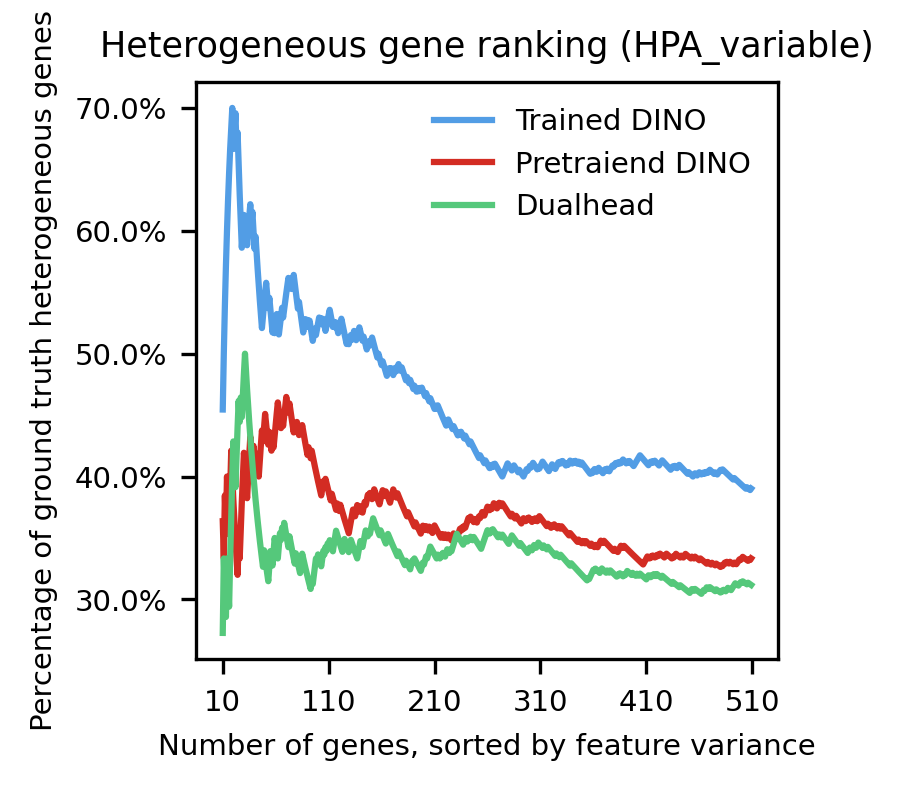

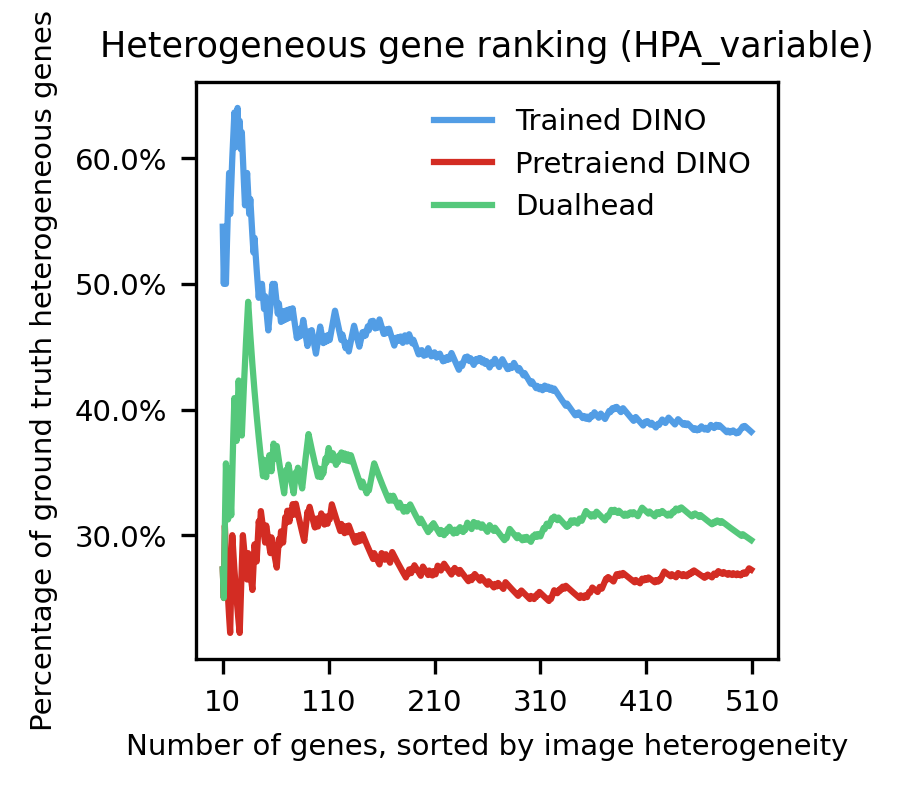

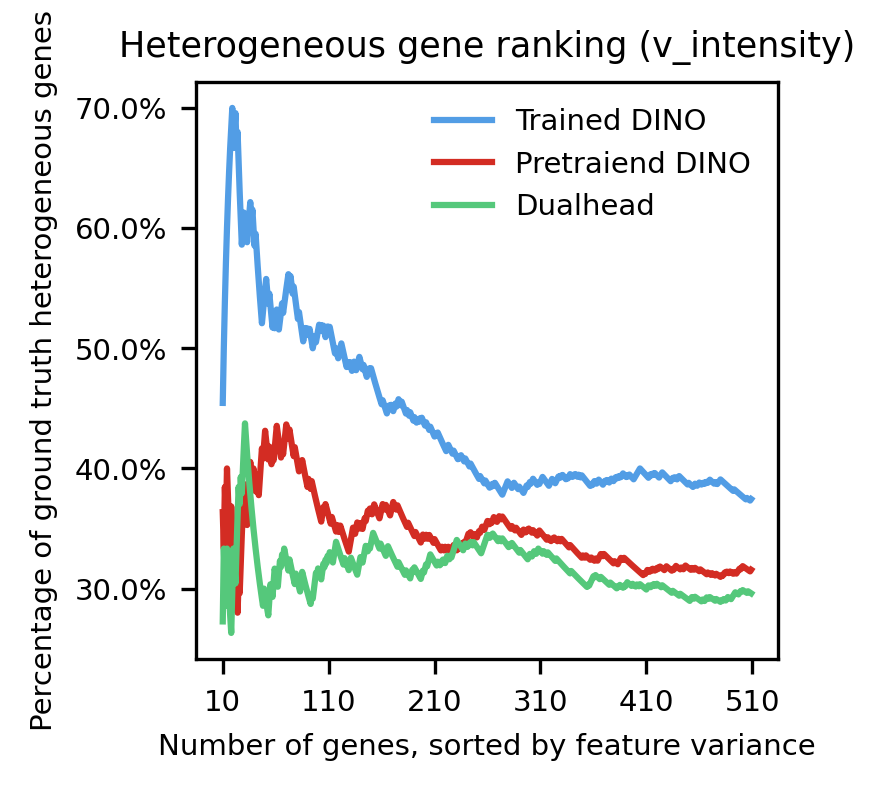

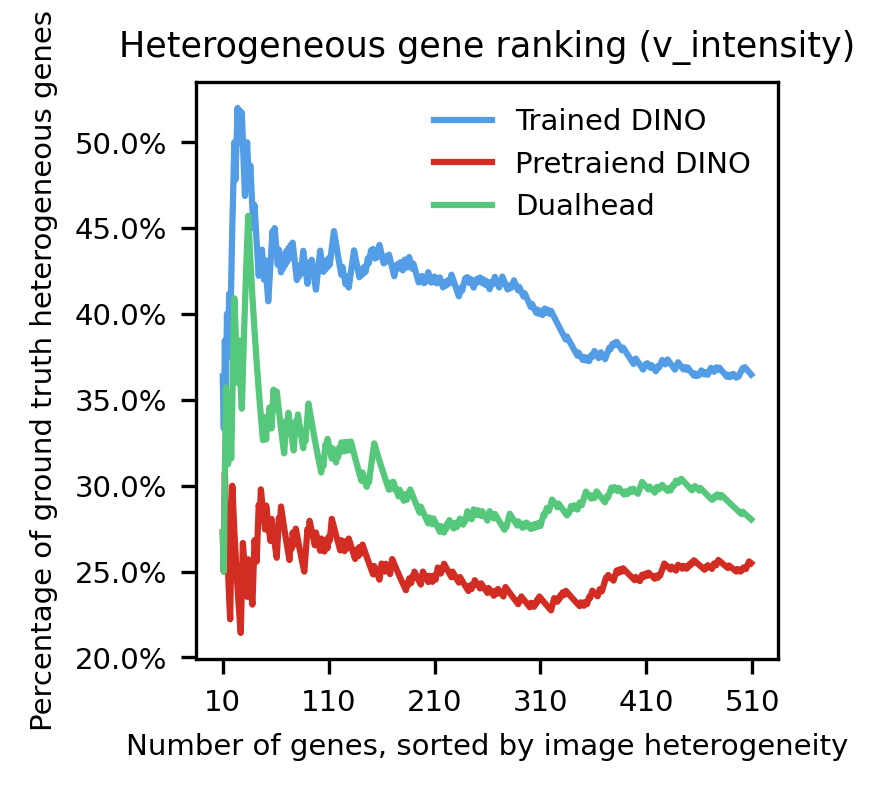

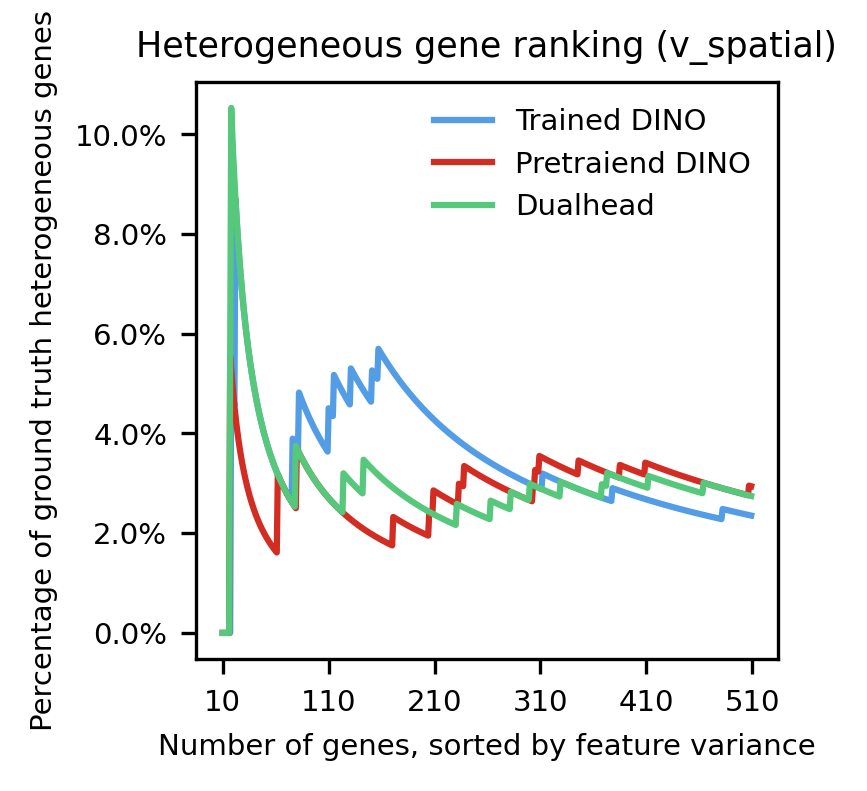

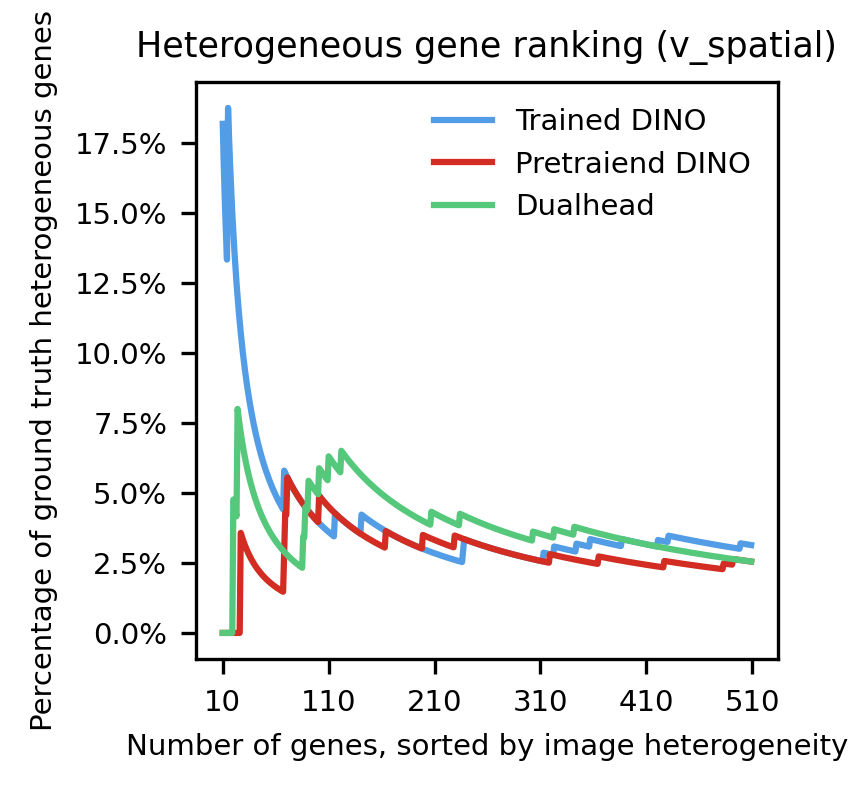

In [5]:
feature_files = [
    'HPA_single_cells_data/DINO_features_for_HPA_single_cells.pth',
    'HPA_single_cells_data/pretrained_DINO_features_for_HPA_single_cells.pth',
    'HPA_single_cells_data/dualhead_features_for_HPA_single_cells.pth',
               ]
labels = [
    'Trained DINO',
    'Pretraiend DINO',
    'Dualhead',
             ]     
condition = 'U-2 OS'
df_master_file = 'HPA_single_cells_data/Master_scKaggle.csv'
gene_heterogeneity_file = 'HPA_single_cells_data/gene_heterogeneity.tsv'
enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image = get_gene_heterogeneity_enrichement(feature_files, df_master_file, gene_heterogeneity_file, heterogenous_type='HPA_variable', use_embedding=False, condition=condition)
plot_gene_heterogeneity_enrichement(labels, enrichments_conditioned_on_gene, enrichments_conditioned_on_image, heterogenous_type='HPA_variable', gene_filename='results/HPA_single_cells/HPA_single_cells_hetero_gene_general.pdf', image_filename='results/HPA_single_cells/HPA_single_cells_hetero_gene_general.pdf')
enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image = get_gene_heterogeneity_enrichement(feature_files, df_master_file, gene_heterogeneity_file, heterogenous_type='v_intensity', use_embedding=False, condition=condition)
plot_gene_heterogeneity_enrichement(labels, enrichments_conditioned_on_gene, enrichments_conditioned_on_image, heterogenous_type='v_intensity', gene_filename='results/HPA_single_cells/HPA_single_cells_hetero_gene_intensity.pdf', image_filename='results/HPA_single_cells/HPA_single_cells_hetero_gene_intensity.pdf')
enrichments_conditioned_on_gene, enrichments_conditioned_on_image, merged_dfs, genes_sorted_conditioned_on_gene, genes_sorted_conditioned_on_image, sorted_metrics_conditioned_on_gene, sorted_metrics_conditioned_on_image, images_sorted_conditioned_on_image, average_precisions_condition_on_gene, average_precisions_condition_on_image = get_gene_heterogeneity_enrichement(feature_files, df_master_file, gene_heterogeneity_file, heterogenous_type='v_spatial', use_embedding=False, condition=condition)
plot_gene_heterogeneity_enrichement(labels, enrichments_conditioned_on_gene, enrichments_conditioned_on_image, heterogenous_type='v_spatial', gene_filename='results/HPA_single_cells/HPA_single_cells_hetero_gene_spatial.pdf', image_filename='results/HPA_single_cells/HPA_single_cells_hetero_gene_spatial.pdf')


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10567/10567 [00:00<00:00, 140090.75it/s]
/scr/mdoron/miniconda3/lib/python3.9/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/scr/mdoron/miniconda3/lib/python3.9/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,
Clipping input data to th

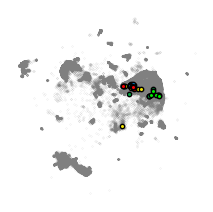

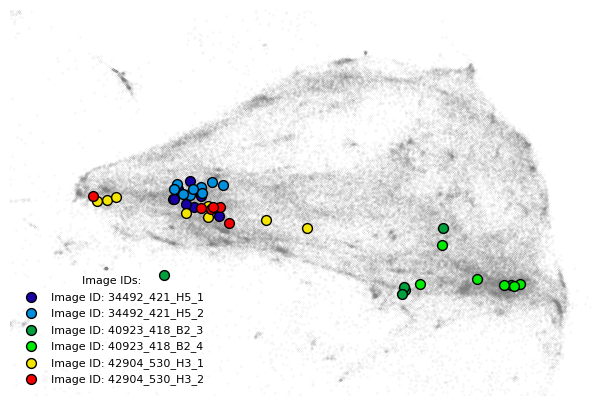

<Figure size 640x480 with 0 Axes>

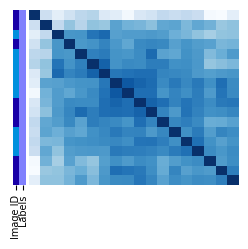

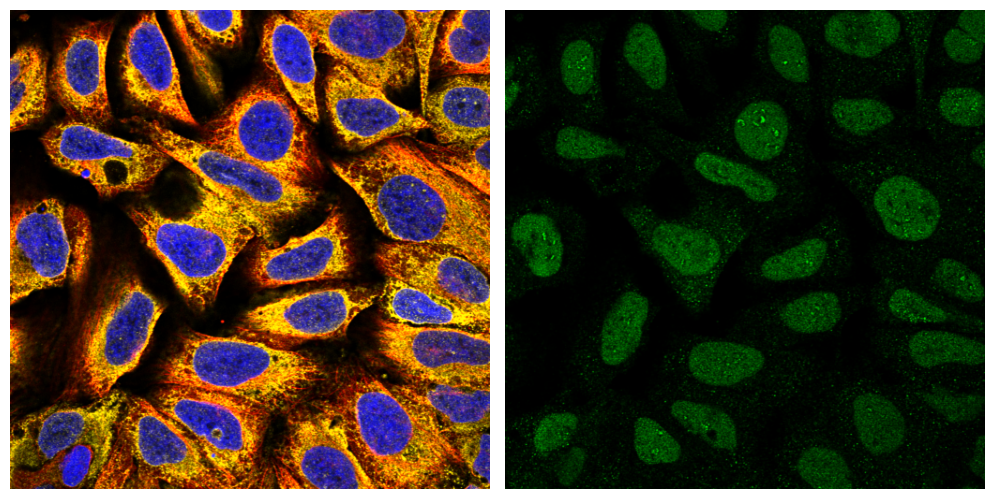

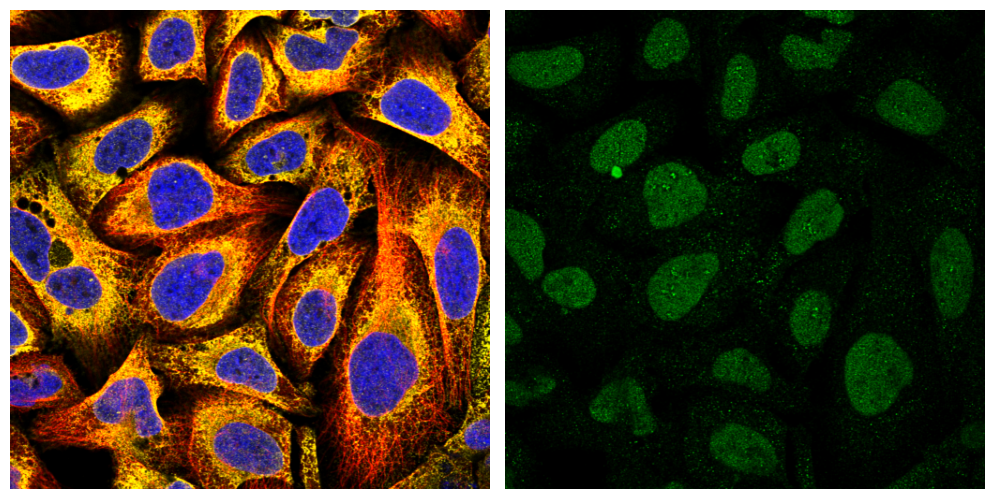

<Figure size 640x480 with 0 Axes>

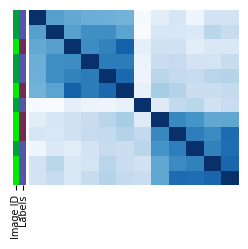

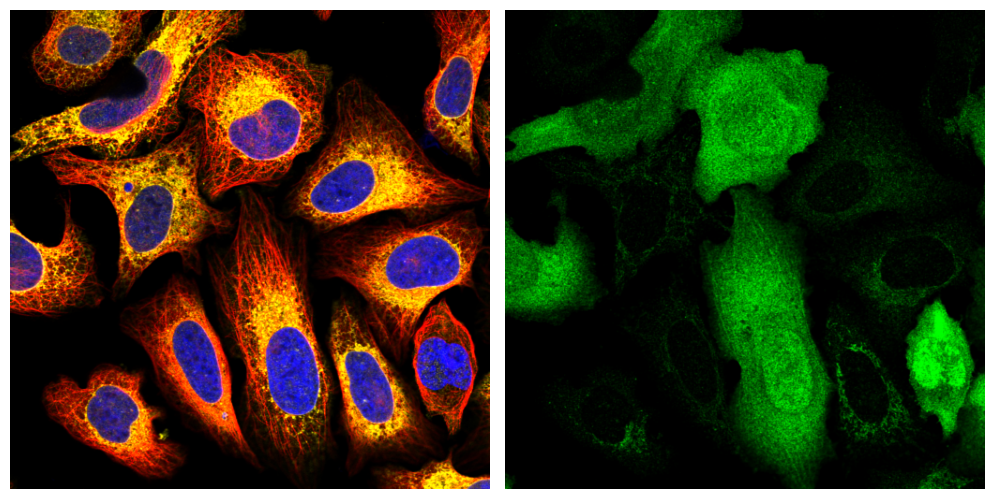

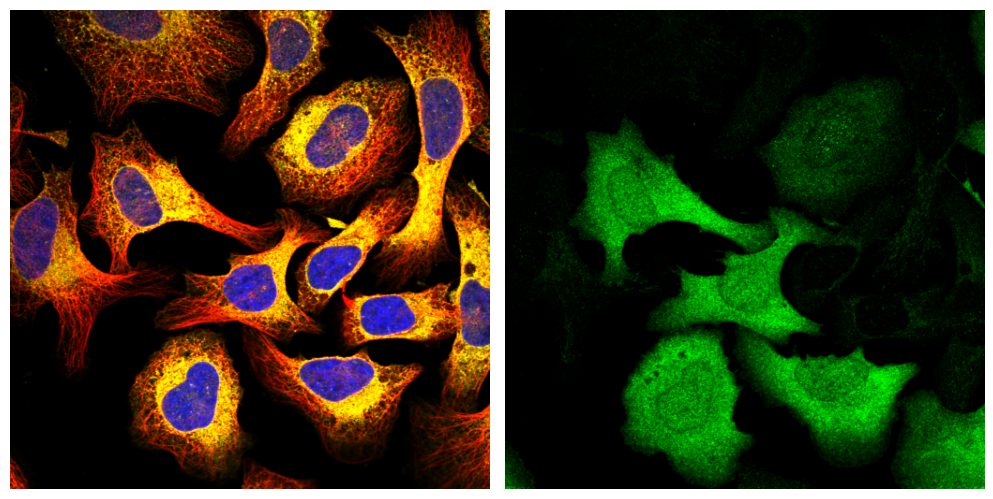

<Figure size 640x480 with 0 Axes>

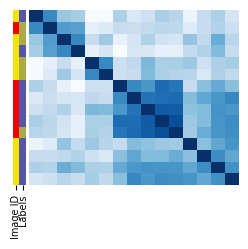

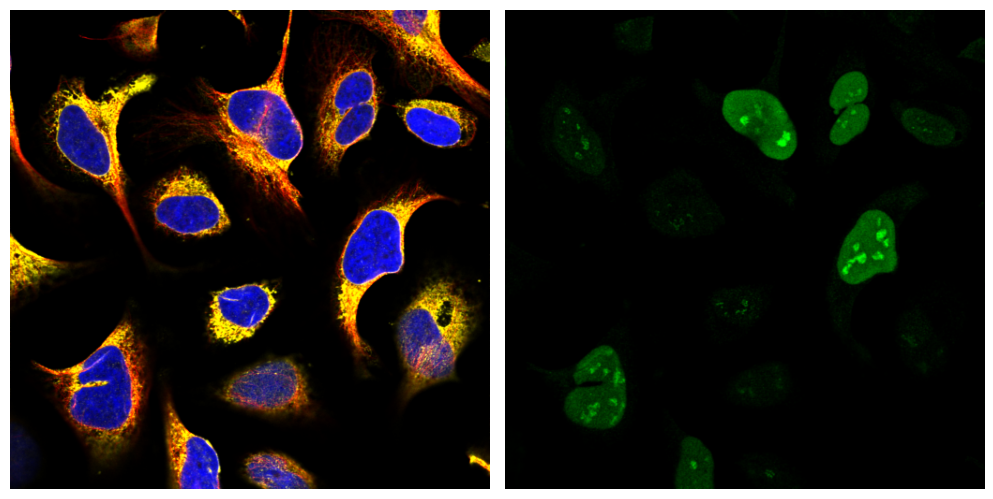

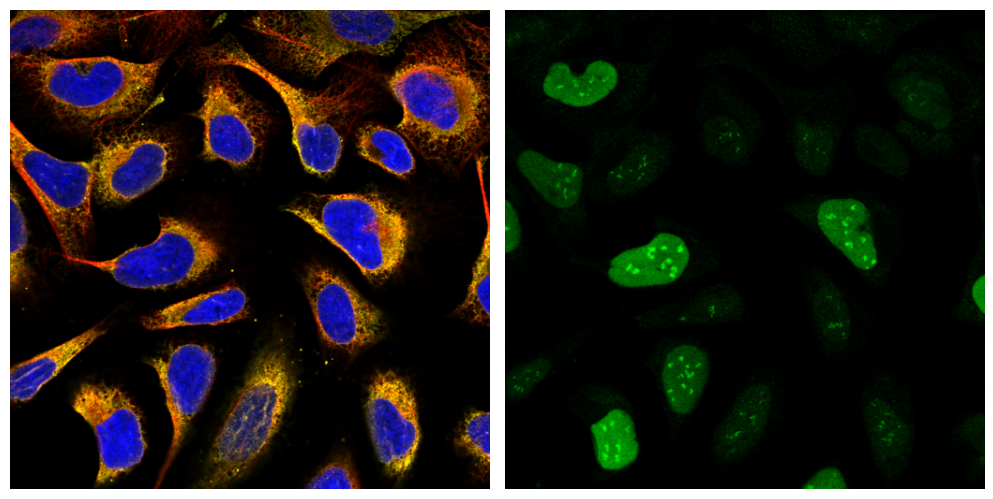

In [6]:
heterogenous_type = 'HPA_variable'
cmap_labels = cm.gist_stern

features, protein_localizations, cell_lines, IDs, df = torch.load('HPA_single_cells_data/DINO_features_for_HPA_single_cells.pth')
embedding = pd.read_csv('/scr/mdoron/Dino4Cells_analysis/HPA_single_cells_data/DINO_embedding_average_umap.csv')[['UMAP_1','UMAP_2']].values

heterogeneity_df = get_heterogeneity_df(df, df_master_file, gene_heterogeneity_file)
merged_df = pd.merge(heterogeneity_df, df, on='ID', how='right').drop_duplicates()
merged_df.loc[pd.isnull(merged_df['Gene']),'Gene'] = ''
merged_df = merged_df.reset_index()
merged_df['original_index'] = merged_df.index.values
merged_df['cell_type'] = merged_df.cell_type_x
original_indices = merged_df.original_index.values
gene_to_ind = merged_df[['Gene','original_index']].groupby('Gene').groups
gene_to_ind = {k : original_indices[gene_to_ind[k]] for k in gene_to_ind.keys()}
merged_df[pd.isnull(merged_df.Gene)].Gene = ''

features = features[np.where(merged_df.cell_type == 'U-2 OS')[0]]
embedding = embedding[np.where(merged_df.cell_type == 'U-2 OS')[0]]
merged_df = merged_df[merged_df.cell_type == 'U-2 OS'].reset_index()

scaled_features, features_mean, features_std = scale(features)
scaled_features = scaled_features.numpy()

indices = merged_df.index.values
merged_df['original_index'] = merged_df.index.values

mean_stds, sorted_images = get_heterogeneousity_per_whole_image(merged_df, scaled_features, indices, metric='std', verbose=False)

metric = mean_stds
sorted_distances = np.array(metric)[np.argsort(metric)[::-1]]

images_sorted = np.array(sorted_images)[np.argsort(metric)[::-1]]
merged_df['image_rank'] = merged_df.ID.map(dict(zip(images_sorted, range(len(images_sorted)))))
merged_df['image_score'] = merged_df.ID.map(dict(zip(images_sorted, sorted_distances)))
genes_and_image_ranks = merged_df.groupby('Gene')['image_rank'].min()
genes_and_image_scores = merged_df.groupby('Gene')['image_score'].max()
genes_ranked_by_images_scores = genes_and_image_scores.values
genes_ranked_by_images_rank = genes_and_image_ranks.values
genes_ranked_by_images_names = genes_and_image_ranks.index.values
genes_sorted = genes_ranked_by_images_names[np.argsort(genes_ranked_by_images_rank)]

enrichment_raw = pd.DataFrame(genes_sorted)[0].isin(merged_df[merged_df[heterogenous_type] == True].Gene.unique()).values
enrichment = []
for ind in tqdm(range(1, len(genes_sorted), 1)):
    enrichment.append(enrichment_raw[:ind].mean())
sorted_distances_per_image = sorted_distances
sorted_distances_per_gene = np.array(genes_ranked_by_images_scores)[np.argsort(genes_ranked_by_images_scores)[::-1]]

merged_df = merged_df[['Gene', 'ID', 'v_spatial', 'v_intensity',
       'HPA_variable', 'cell_type_x', 'Unnamed: 0', 'file', 'cell_type_y',
       'actin filaments,focal adhesion sites', 'aggresome',
       'centrosome,centriolar satellite', 'cytosol', 'endoplasmic reticulum',
       'golgi apparatus', 'intermediate filaments', 'microtubules',
       'mitochondria', 'mitotic spindle', 'no staining', 'nuclear bodies',
       'nuclear membrane', 'nuclear speckles', 'nucleoli',
       'nucleoli fibrillar center', 'nucleoplasm',
       'plasma membrane,cell junctions',
       'vesicles,peroxisomes,endosomes,lysosomes,lipid droplets,cytoplasmic bodies',
       'A-431', 'A549', 'AF22', 'ASC TERT1', 'BJ', 'CACO-2', 'EFO-21', 'HAP1',
       'HDLM-2', 'HEK 293', 'HEL', 'HUVEC TERT2', 'HaCaT', 'HeLa', 'Hep G2',
       'JURKAT', 'K-562', 'MCF7', 'PC-3', 'REH', 'RH-30', 'RPTEC TERT1', 'RT4',
       'SH-SY5Y', 'SK-MEL-30', 'SiHa', 'U-2 OS', 'U-251 MG', 'hTCEpi',
       'original_index', 'cell_type', 'image_rank']]    

gene2uniprot = pd.read_csv('/scr/mdoron/Dino4Cells_analysis/HPA_single_cells_data/XML_HPA.csv')[['gene','uniport_id']].drop_duplicates()
uniprot2name = pd.read_csv('/scr/mdoron/Dino4Cells_analysis/HPA_single_cells_data/uniport_interactions.tsv', delimiter='\t')[['Entry','Gene Names']].drop_duplicates()
gene2name = pd.merge(uniprot2name, gene2uniprot, right_on='uniport_id', left_on='Entry')[['gene','Gene Names']]
all_df = merged_df.copy()

# image_rank = list(images_sorted).index('55544_1888_B6_3')
gene_name_1 = 'EFHC2'
gene_name_2 = 'PSTPIP2'
gene_name_3 = 'NUSAP1'
gene_1 = merged_df[merged_df.Gene == gene2name[gene2name['Gene Names'].apply(lambda x:gene_name_1 in str(x))]['gene'].iloc[0]].Gene.iloc[0]
gene_2 = merged_df[merged_df.Gene == gene2name[gene2name['Gene Names'].apply(lambda x:gene_name_2 in str(x))]['gene'].iloc[0]].Gene.iloc[0]
gene_3 = merged_df[merged_df.Gene == gene2name[gene2name['Gene Names'].apply(lambda x:gene_name_3 in str(x))]['gene'].iloc[0]].Gene.iloc[0]
image_rank_1 = merged_df[merged_df.Gene == gene2name[gene2name['Gene Names'].apply(lambda x:gene_name_1 in str(x))]['gene'].iloc[0]].image_rank.iloc[0]
image_rank_2 = merged_df[merged_df.Gene == gene2name[gene2name['Gene Names'].apply(lambda x:gene_name_2 in str(x))]['gene'].iloc[0]].image_rank.iloc[0]
image_rank_3 = merged_df[merged_df.Gene == gene2name[gene2name['Gene Names'].apply(lambda x:gene_name_3 in str(x))]['gene'].iloc[0]].image_rank.iloc[0]
use_well = True
cell_preds = None

gene_1 = merged_df[merged_df.ID == images_sorted[image_rank_1]].Gene.iloc[0]
gene_2 = merged_df[merged_df.ID == images_sorted[image_rank_2]].Gene.iloc[0]
gene_3 = merged_df[merged_df.ID == images_sorted[image_rank_3]].Gene.iloc[0]
gane_name_1 = gene2name[gene2name.gene == gene_1]['Gene Names'].iloc[0].split(' ')[0]
gane_name_2 = gene2name[gene2name.gene == gene_2]['Gene Names'].iloc[0].split(' ')[0]
gane_name_3 = gene2name[gene2name.gene == gene_3]['Gene Names'].iloc[0].split(' ')[0]

if use_well:
    gene_indices_1 = np.where(all_df.ID.apply(lambda x:'_'.join(x.split('_')[:2])) == '_'.join(images_sorted[image_rank_1].split('_')[:2]))[0]
    gene_indices_2 = np.where(all_df.ID.apply(lambda x:'_'.join(x.split('_')[:2])) == '_'.join(images_sorted[image_rank_2].split('_')[:2]))[0]
    gene_indices_3 = np.where(all_df.ID.apply(lambda x:'_'.join(x.split('_')[:2])) == '_'.join(images_sorted[image_rank_3].split('_')[:2]))[0]
else:
    gene_indices_1 = np.where(merged_df.ID == images_sorted[image_rank_1])[0]
    gene_indices_2 = np.where(merged_df.ID == images_sorted[image_rank_2])[0]
    gene_indices_3 = np.where(merged_df.ID == images_sorted[image_rank_3])[0]

all_gene_indices = [
    gene_indices_1,
    gene_indices_2,
    gene_indices_3
]    
gene_df_1 = merged_df.iloc[gene_indices_1].reset_index()
gene_df_2 = merged_df.iloc[gene_indices_2].reset_index()
gene_df_3 = merged_df.iloc[gene_indices_3].reset_index()

targets = torch.Tensor(protein_localizations)
gene_df_1['well'] = gene_df_1.ID
gene_df_2['well'] = gene_df_2.ID
gene_df_3['well'] = gene_df_3.ID
gene_dfs = [gene_df_1, gene_df_2, gene_df_3]
dists_1 = pdist(scaled_features[gene_indices_1], metric='cosine')
dists_2 = pdist(scaled_features[gene_indices_2], metric='cosine')
dists_3 = pdist(scaled_features[gene_indices_3], metric='cosine')
all_dists = [dists_1, dists_2, dists_3]
Z_1 = linkage(dists_1, 'ward')
Z_2 = linkage(dists_2, 'ward')
Z_3 = linkage(dists_3, 'ward')
image_IDs_1 = gene_df_1.ID
image_IDs_2 = gene_df_2.ID
image_IDs_3 = gene_df_3.ID

combined_image_IDs = np.concatenate([image_IDs_1,image_IDs_2,image_IDs_3])
cmap_labels = cm.gist_stern
cmap_image_IDs = cm.nipy_spectral
image_ID_colors = {sorted(np.unique(combined_image_IDs))[i] : cmap_image_IDs(((i + 1) / (len(np.unique(combined_image_IDs)) + 1))) for i in range(len(np.unique(combined_image_IDs)))}
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
plt.scatter(embedding[:,0], 
            embedding[:,1],
            marker='o',
            color='grey',
            alpha=0.5,
           s=0.01)

axis_bounderies = [np.inf, -np.inf, np.inf, -np.inf]
for example_ind, image_IDs in enumerate([image_IDs_1,image_IDs_2,image_IDs_3]):
    for image_ID in sorted(np.unique(image_IDs)):
        indices = np.where(image_IDs == image_ID)[0]
        plt.scatter(embedding[all_gene_indices[example_ind]][indices, 0], 
                    embedding[all_gene_indices[example_ind]][indices, 1],
                    marker='o',
                    color=image_ID_colors[image_ID],
                    edgecolors='black',
                   label=f'Image ID: {image_ID}',
                   s=10)
        axis_bounderies[0] = min(axis_bounderies[0], min(embedding[all_gene_indices[example_ind]][indices, 0]))
        axis_bounderies[1] = max(axis_bounderies[1], max(embedding[all_gene_indices[example_ind]][indices, 0]))
        axis_bounderies[2] = min(axis_bounderies[2], min(embedding[all_gene_indices[example_ind]][indices, 1]))
        axis_bounderies[3] = max(axis_bounderies[3], max(embedding[all_gene_indices[example_ind]][indices, 1]))
   
plt.xticks([])
plt.yticks([])
plt.axis(False)
plt.savefig('results/HPA_single_cells/HPA_single_cells_small_hetero_umap.pdf', format='pdf')


cmap_labels = cm.gist_stern
cmap_image_IDs = cm.nipy_spectral
image_ID_colors = {sorted(np.unique(combined_image_IDs))[i] : cmap_image_IDs(((i + 1) / (len(np.unique(combined_image_IDs)) + 1))) for i in range(len(np.unique(combined_image_IDs)))}
fig, ax = plt.subplots(1,1,figsize=(2.5 * 3,2.5 * 2))
plt.scatter(embedding[:,0], 
            embedding[:,1],
            marker='o',
            color='grey',
            alpha=0.5,
           s=0.01)

axis_bounderies = [np.inf, -np.inf, np.inf, -np.inf]
for example_ind, image_IDs in enumerate([image_IDs_1,image_IDs_2,image_IDs_3]):
    for image_ID in sorted(np.unique(image_IDs)):
        indices = np.where(image_IDs == image_ID)[0]
        plt.scatter(embedding[all_gene_indices[example_ind]][indices, 0], 
                    embedding[all_gene_indices[example_ind]][indices, 1],
                    marker='o',
                    color=image_ID_colors[image_ID],
                    edgecolors='black',
                   label=f'Image ID: {image_ID}',
                   s=50)
        axis_bounderies[0] = min(axis_bounderies[0], min(embedding[all_gene_indices[example_ind]][indices, 0]))
        axis_bounderies[1] = max(axis_bounderies[1], max(embedding[all_gene_indices[example_ind]][indices, 0]))
        axis_bounderies[2] = min(axis_bounderies[2], min(embedding[all_gene_indices[example_ind]][indices, 1]))
        axis_bounderies[3] = max(axis_bounderies[3], max(embedding[all_gene_indices[example_ind]][indices, 1]))

axis_bounderies[0] -= 3
axis_bounderies[1] += 3
axis_bounderies[2] += 10
axis_bounderies[3] += 10
plt.xticks([])
plt.yticks([])
plt.axis(axis_bounderies)
plt.axis(False)

legend = plt.legend(frameon=False, fontsize=8, title='Image IDs:')
plt.setp(legend.get_title(),fontsize=8)
plt.savefig('results/HPA_single_cells/HPA_single_cells_large_hetero_umap.pdf', format='pdf')


all_example_targets = ((targets[np.concatenate(all_gene_indices)]).numpy()).astype(int)
all_c2 = [str(list(i)) for i in all_example_targets]
lut1 = dict(zip(np.unique(all_c2), [cmap_labels((i + 1) / (2 + len(np.unique(all_c2)))) for i in range(len(np.unique(all_c2)))]))

for example_ind, gene_indices in enumerate(all_gene_indices):
    gene_df = gene_dfs[example_ind]
    row_colors1 = gene_dfs[example_ind]['ID'].map(image_ID_colors)
    row_colors1.name = 'Image ID'
    b = ((targets[gene_indices]).numpy()).astype(int)
    c2 = [str(list(i)) for i in b]
    series = pd.DataFrame(c2)[0]
    series.name = 'Labels'
    row_colors3 = series.map(lut1)
    row_colors = pd.concat([row_colors1,row_colors3],axis=1)

    if cell_preds is not None:
        b = ((cell_preds[gene_indices])).astype(int)
        c1 = [str(list(i)) for i in b]
        series = pd.DataFrame(c1)[0]
        series.name = 'Prediction'
        lut1 = dict(zip(np.unique(c1), [cmap_labels(i / len(np.unique(c1))) for i in range(len(np.unique(c1)))]))
        row_colors2 = series.map(lut1)
        row_colors = pd.concat([row_colors1,row_colors2,row_colors3],axis=1)
    
    plt.figure()
    c = clustermap(pd.DataFrame(squareform(all_dists[example_ind])),
                   figsize=(2.5, 2.5),
                   cbar_pos=None, 
                   xticklabels=[], 
                   yticklabels=[], 
                   cmap='Blues_r', 
                   dendrogram_ratio=[0,0],
                   col_cluster=True,
                   row_cluster=True,
                   row_colors = row_colors,
                   cbar_kws={"size": 20},
                   facecolor='white'
    )
    num_to_protein = {ind : k for ind, k in enumerate(sorted(protein_to_num_single_cells.keys()))}
    plt.savefig(f'results/HPA_single_cells/HPA_single_cells_hetero_similarity_{[gene_name_1, gene_name_2, gene_name_3][example_ind]}.pdf', format='pdf')
    
    for ID in gene_df.ID.unique():
        gene_type = 'heterogeneous' if merged_df[merged_df.ID == ID].HPA_variable.iloc[0] == True else 'unlabeled'
        img = io.imread(f'/scr/mdoron/Dino4Cells/data/whole_images/{ID}.png')
        fig, axes = plt.subplots(1,2,figsize=(10,5))
        microtu = img[:,:,0]
        protein = img[:,:,1]
        nucleus = img[:,:,2]
        ereticu = img[:,:,3]
        RGB = np.zeros((nucleus.shape[0], nucleus.shape[1], 3))
        RGB += microtu[:,:,np.newaxis] * np.asarray([[[1,0,0]]])
        RGB += nucleus[:,:,np.newaxis] * np.asarray([[[0,0,1]]])
        RGB += ereticu[:,:,np.newaxis] * np.asarray([[[1,1,0]]])
        RGB = RGB / 255.
        axes[0].imshow(RGB)
        axes[0].axis(False)
        RGB = np.zeros((nucleus.shape[0], nucleus.shape[1], 3))
        RGB += protein[:,:,np.newaxis] * np.asarray([[[0,1,0]]])
        RGB = RGB / 255.
        axes[1].imshow(RGB)
        axes[1].axis(False)
        plt.tight_layout()
        plt.savefig(f'results/HPA_single_cells/HPA_single_cells_hetero_ID_{ID}.pdf', format='pdf')



### Analysing key descriptors

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:19<00:00,  2.52it/s]


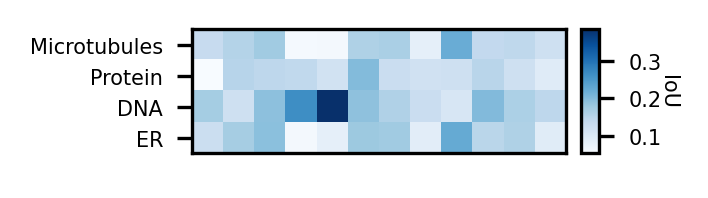

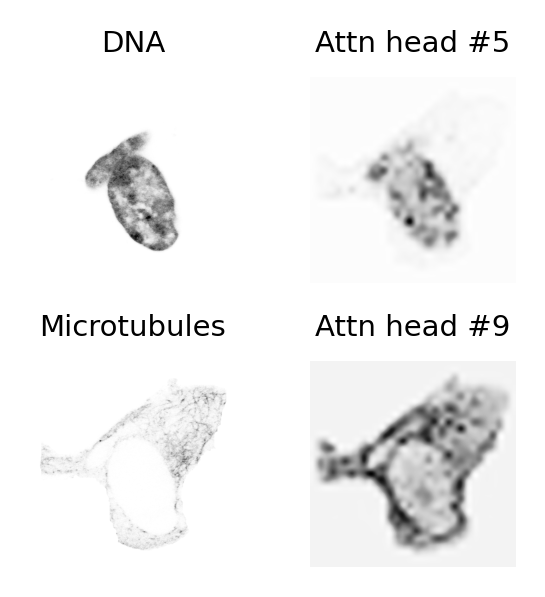

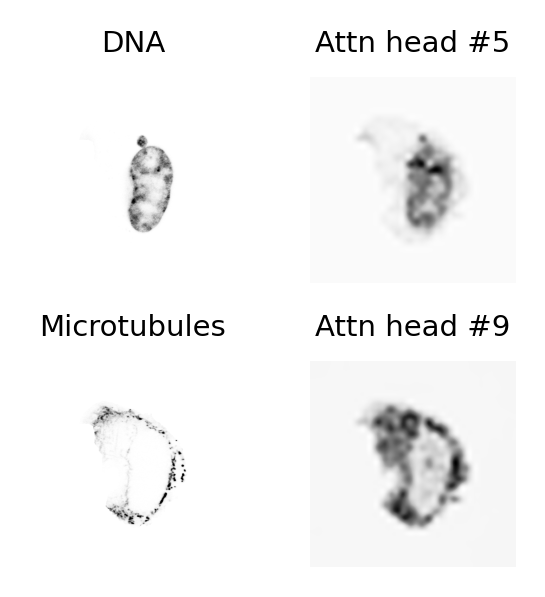

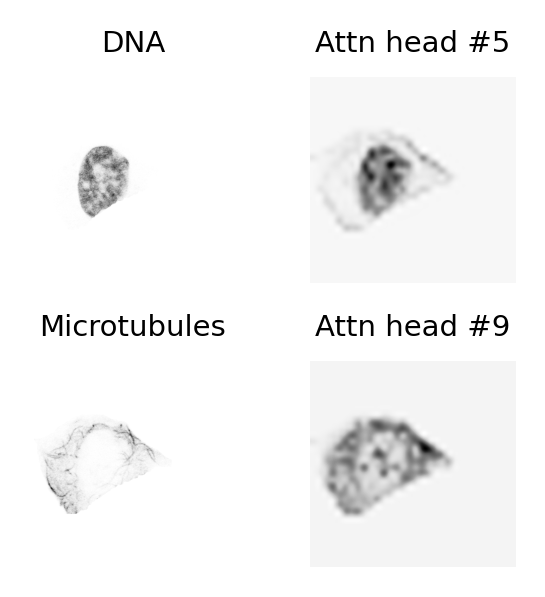

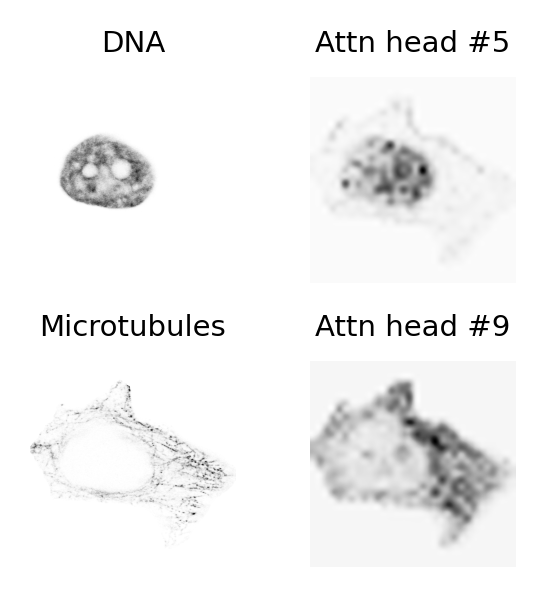

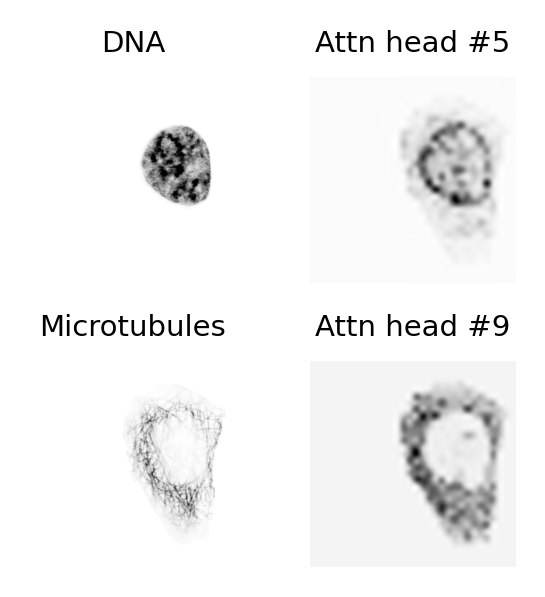

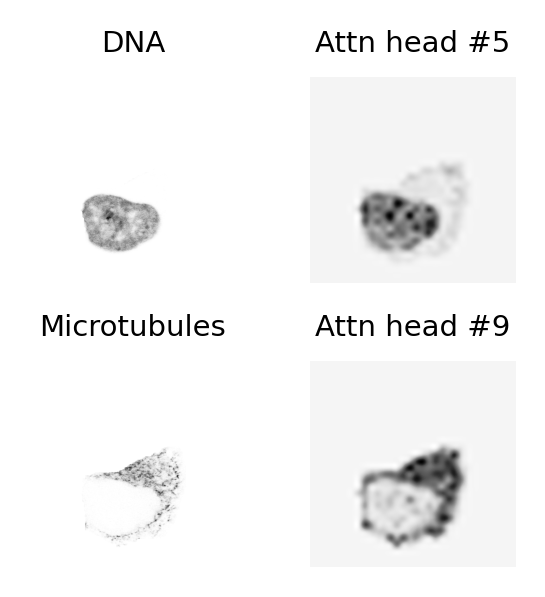

In [30]:
config = yaml.safe_load(open('/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml', "r"))
# config = yaml.safe_load(open('/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_3_channel.yaml', "r"))

model = vits.__dict__[config["model"]["arch"]](
    img_size=[config["embedding"]["image_size"]],
    patch_size=config["model"]["patch_size"],
    drop_path_rate=0.1,  # stochastic depth
    in_chans=config["model"]["num_channels"],
)
state_dict = torch.load(config['embedding']['pretrained_weights'])
teacher = state_dict
if "teacher" in state_dict.keys():
    teacher = state_dict["teacher"]
teacher = {k.replace("module.", ""): v for k, v in teacher.items()}
teacher = {k.replace("backbone.", ""): v for k, v in teacher.items()}
model.load_state_dict(teacher, strict=False)
extractor = ViTExtractor(
    model_type='dino_vits16',
    model=model,
    stride=config["model"]["patch_size"],
    device='cuda',
    load_size=224,
)

from skimage import io
from typing import Union, List, Tuple
from PIL import Image
from pathlib import Path
from torchvision import transforms
from utils.augmentations import Single_cell_Resize, Single_cell_centered, self_normalize

def hpa_preprocess(
    image_path: Union[str, Path],
    load_size: Union[int, Tuple[int, int]] = None,
) -> Tuple[torch.Tensor, Image.Image]:
    img = io.imread(image_path).astype(float)
    img -= img.min(axis=(0,1))
    img /= img.max(axis=(0,1))
    img = (img * 255).astype(np.uint8)
    pil_image = img
    if load_size is not None:
        pil_image = transforms.Resize(
            load_size, interpolation=transforms.InterpolationMode.LANCZOS
        )(pil_image.astype(float))
    prep = transforms.Compose(
        [
            transforms.ToTensor(),
#             Single_cell_centered(),
            self_normalize(),
        ]
    )
    prep_img = prep(pil_image)[None, ...]
    return prep_img, pil_image


df = pd.read_csv(config['embedding']['df_path'])
small_df = df.sample(frac=1)

num_cells_per_group = 50
small_df = small_df.iloc[:num_cells_per_group]

images_paths = small_df.file.values
all_descriptors = []
all_images = []
all_features = []
for path in tqdm(images_paths):
    image_batch, image_pil = hpa_preprocess(path)  
    descs = extractor._extract_features(image_batch.to('cuda'), [11], 'attn')[0].detach().cpu().numpy()
    all_descriptors.append(descs)
    all_images.append(np.array(image_pil))
    all_features.append(model(image_batch.to('cuda')).detach().cpu().numpy())
all_descriptors = np.stack(all_descriptors)
all_images = np.stack(all_images)


IOUs = np.zeros((4, 12))
image_batches = []
for path in tqdm(images_paths):
    image_batch, img = hpa_preprocess(path) 
    image_batches.append(image_batch)
    channel_masks = [((img[:, :, img_c] > 
                   threshold_otsu(img[:, :, img_c].flatten()[img[:, :, img_c].flatten().nonzero()])).astype(int)) for img_c in range(4)]

    attention_masks = [extractor._extract_features(image_batch.to('cuda'), [11], "attn")[0][:,head_ind,0,1:].detach().cpu().reshape(32,32).numpy() for head_ind in range(12)]
    attention_masks = [cv2.resize(m, dsize=(512, 512), interpolation=cv2.INTER_CUBIC) for m in attention_masks]
    attention_masks = [m > threshold_otsu(m) for m in attention_masks]

    for channel_mask_ind, channel_mask in enumerate(channel_masks):
        for attention_mask_ind, attention_mask in enumerate(attention_masks):
            overlap = channel_mask * attention_mask
            union = channel_mask + attention_mask
            IOU = overlap.sum()/float(union.sum())
            IOUs[channel_mask_ind][attention_mask_ind] += IOU

IOUs /= len(all_images)


from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(1,1,figsize=(1.75,0.85), dpi=300)
im = plt.imshow(IOUs, cmap='Blues')
plt.xticks([]
          )
plt.yticks(range(4), 
           ['Microtubules','Protein','DNA','ER'],
           fontsize=5
          )

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
cbar = plt.colorbar(im, cax=cax)
cbar.ax.tick_params(labelsize=5)
cbar.set_label('IoU', rotation=270, fontsize=5)

plt.savefig('results/HPA_single_cells/HPA_single_cells_attention_ratio.pdf', format='pdf')

for ind in range(6):
    fig, axes = plt.subplots(2,2,figsize=(2,2), dpi=300)
    axes[0][0].imshow(all_images[ind, :, :, 2], cmap='Greys')
    axes[0][0].axis('off')
    axes[0][0].set_title('DNA', fontsize=7)
    plt.tight_layout()
    attention_mask = extractor._extract_features(image_batches[ind].to('cuda'), [11], "attn")[0][:,4,0,1:].detach().cpu().reshape(32,32).numpy()
    attention_mask = cv2.resize(attention_mask, dsize=(512, 512), interpolation=cv2.INTER_CUBIC)
    axes[0][1].imshow(attention_mask, cmap='Greys')
    axes[0][1].axis('off')
    axes[0][1].set_title('Attn head #5', fontsize=7)
    plt.tight_layout()
    axes[1][0].imshow(all_images[ind, :, :, 0], cmap='Greys')
    axes[1][0].axis('off')
    axes[1][0].set_title('Microtubules', fontsize=7)
    plt.tight_layout()
    attention_mask = extractor._extract_features(image_batches[ind].to('cuda'), [11], "attn")[0][:,8,0,1:].detach().cpu().reshape(32,32).numpy()
    attention_mask = cv2.resize(attention_mask, dsize=(512, 512), interpolation=cv2.INTER_CUBIC)
    axes[1][1].imshow(attention_mask, cmap='Greys')
    axes[1][1].set_title('Attn head #9', fontsize=7)
    axes[1][1].axis('off')
    plt.tight_layout()
    plt.savefig(f'results/HPA_single_cells/HPA_single_cells_attention_cell_{ind}.pdf', format='pdf')
    